In [ ]:
!pip install pytorch_lightning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 22.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 58.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 50.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 68.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.5/963.5 kB 50.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-

In [ ]:
import pytorch_lightning as pl
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import matplotlib.pyplot as plt

class EncoderLayer(nn.Module):
    def __init__(self, input_height, input_width, in_channels, out_channels, kernel, padding, stride):
        super().__init__()
        self.input_height = input_height
        self.input_width = input_width
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel = kernel
        self.stride = stride
        self.padding = padding
        self.conv = nn.Conv2d(self.in_channels, self.out_channels, kernel_size = self.kernel, padding=self.padding, stride=self.stride)

    def forward(self, x):
        x = F.gelu(self.conv(x))
        return x

    def get_output_shape(self):
        output_height = (self.input_height - self.kernel + 2 * self.padding) // self.stride + 1
        output_width = (self.input_width - self.kernel + 2 * self.padding) // self.stride + 1
        return output_height, output_width, self.out_channels

class DecoderLayer(nn.Module):
    def __init__(self, input_height, input_width, in_channels, out_channels, kernel, padding, out_padding=0, stride=2, tanh_activation=False):
        super().__init__()
        self.input_height = input_height
        self.input_width = input_width
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel = kernel
        self.padding = padding
        self.out_padding = out_padding
        self.stride = stride
        self.tanh_activation = bool(tanh_activation)
        self.inv_conv = nn.ConvTranspose2d(self.in_channels, self.out_channels, kernel_size = self.kernel, padding=self.padding, output_padding=self.out_padding, stride=self.stride)

    def forward(self, x):
        if self.tanh_activation:
            x = torch.tanh(self.inv_conv(x))
        else:
            x = F.gelu(self.inv_conv(x))
        return x

    def get_output_shape(self):
        output_height = (self.input_height - 1) * self.stride - 2 * self.padding + self.kernel + self.out_padding
        output_width = (self.input_width - 1) * self.stride - 2 * self.padding + self.kernel + self.out_padding
        #out​=(Hin​−1)×stride[0]−2×padding[0]+dilation[0]×(kernel_size[0]−1)+output_padding[0]+1
        #Wout​=(Win​−1)×stride[1]−2×padding[1]+dilation[1]×(kernel_size[1]−1)+output_padding[1]+1
        return output_height, output_width, self.out_channels



class BatchNormLayer(nn.Module):
    def __init__(self, input_height, input_width, channels):
        super().__init__()
        self.channels = channels
        self.input_height = input_height
        self.input_width = input_width
        self.bn = nn.BatchNorm2d(self.channels)

    def forward(self, x):
        x = self.bn(x)
        return x

    def get_output_shape(self):
        return self.input_height, self.input_width, self.channels

# autoencoder = input_height, input_width, input_channels, encoder_layers, decoder_layers
# encoder_layers / decoder_layers = [[out_channels1, kernel1, padding1, stride, 'encoder_layer'], ['batchnorm'],  ...]
# decoder_layer = [out_channels, kernel, padding, out_padding, stride, tanh_activation, 'decoder_layer']

class AutoEncoder(pl.LightningModule):
    def __init__(self, input_height, input_width, input_channels, encoder_layers, latent_size, decoder_layers):
        super().__init__()
        self.input_height = input_height
        self.input_width = input_width
        self.input_channels = input_channels
        self.encoder_layers = encoder_layers
        self.decoder_layers = decoder_layers
        self.encoder = nn.ModuleList()
        self.decoder = nn.ModuleList()
        self.fully_connected_section = nn.ModuleList()
        self.dimensions_memory = []
        self.train_loss_memory = []
        self.val_loss_memory = []

        for i in range(len(self.encoder_layers)):
            if self.encoder_layers[i][-1] == 'encoder_layer':
              encoder_layer = EncoderLayer(self.input_height, self.input_width, self.input_channels, self.encoder_layers[i][0], self.encoder_layers[i][1], self.encoder_layers[i][2], self.encoder_layers[i][3])
              self.encoder.append(encoder_layer)
              self.input_height, self.input_width, self.input_channels = encoder_layer.get_output_shape()
              self.dimensions_memory.append([self.input_height, self.input_width, self.input_channels])
            elif self.encoder_layers[i][-1] == 'batchnorm':
              batchnorm_layer = BatchNormLayer(self.input_height, self.input_width, self.input_channels)
              self.encoder.append(batchnorm_layer)
              self.input_height, self.input_width, self.input_channels = batchnorm_layer.get_output_shape()
              self.dimensions_memory.append([self.input_height, self.input_width, self.input_channels])

        self.fc_input_size = self.input_height * self.input_width * self.input_channels
        self.latent_size = latent_size
        self.latent_height = self.input_height
        self.latent_width = self.input_width
        self.latent_channels = self.input_channels

        self.fc_mu  = nn.Linear(self.fc_input_size, self.latent_size) # linear layers που δίνουν mean και log-variance (δεδομένου ότι loss function βασίζεται σε KL divergence) του posterior (latent) distribution
        self.fc_var = nn.Linear(self.fc_input_size, self.latent_size)
        self.fc_decode = nn.Linear(self.latent_size, self.fc_input_size)



        for i in range(len(self.decoder_layers)):
            if self.decoder_layers[i][-1] == 'decoder_layer':
              decoder_layer = DecoderLayer(self.input_height, self.input_width, self.input_channels, self.decoder_layers[i][0], self.decoder_layers[i][1], self.decoder_layers[i][2], self.decoder_layers[i][3], self.decoder_layers[i][4], self.decoder_layers[i][5])
              self.decoder.append(decoder_layer)
              self.input_height, self.input_width, self.input_channels = decoder_layer.get_output_shape()
              self.dimensions_memory.append([self.input_height, self.input_width, self.input_channels])
            elif self.decoder_layers[i][-1] == 'batchnorm':
              batchnorm_layer = BatchNormLayer(self.input_height, self.input_width, self.input_channels)
              self.decoder.append(batchnorm_layer)
              self.input_height, self.input_width, self.input_channels = batchnorm_layer.get_output_shape()
              self.dimensions_memory.append([self.input_height, self.input_width, self.input_channels])

        self.encoder_sequence = nn.Sequential(*self.encoder)
        self.decoder_sequence = nn.Sequential(*self.decoder)


    def encode(self, x):
        x = self.encoder_sequence(x)
        x = torch.flatten(x, 1)
        mu = self.fc_mu(x)
        var = self.fc_var(x)
        return mu, var


    def reparam_trick(self, mu, var):  # reparametrization trick
        std = torch.exp(0.5 * var)
        eps = torch.randn_like(std)
        return mu + eps * std


    def decode(self, x):
        x = self.fc_decode(x)
        b = x.size(0)
        x = x.view(b, self.latent_channels, self.latent_height, self.latent_width)
        x = self.decoder_sequence(x)
        return x


    def forward(self, x):
        mu, var = self.encode(x)
        z = self.reparam_trick(mu, var)
        z = self.decode(z)
        return z, mu, var

    @staticmethod
    def vae_loss(reconstruction, x, mu, var):
        reconstruction_loss = F.mse_loss(reconstruction, x, reduction='sum')  # MSE loss μεταξύ input και reconstruction
        kld = -0.5 * torch.sum(1 + var - mu.pow(2) - var.exp())                    # kullback-leibler divergence για εκτίμηση απόκλισης μεταξύ prior N(0,1) και posterior distribution
        return reconstruction_loss + kld


    def training_step(self, batch, batch_idx):
        x, _ = batch
        z, mu, var = self(x)
        loss = self.vae_loss(z, x, mu, var)
        self.log('train_loss', loss)
        self.train_loss_memory.append(loss.item())
        return loss

    def validation_step(self, batch, batch_idx):
        x, _ = batch
        recon, mu, var = self(x)
        loss = self.vae_loss(recon, x, mu, var)
        self.log('val_loss', loss, prog_bar=True)
        self.val_loss_memory.append(loss.item())
        return loss


    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-3)

    def get_latent_space_dimensions(self):
        return self.latent_height, self.latent_width, self.latent_channels

    def get_dimensions_memory(self):
        return self.dimensions_memory



In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

batch_size = 256
num_train = 45000
num_val = 5000
input_channels = 3
image_size = 32

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])

full_train_dataset = datasets.CIFAR10(root="./data", train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root="./data", train=False, download=True, transform=transform)
train_dataset, val_dataset = random_split(full_train_dataset, [num_train, num_val])


train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)


100%|██████████| 170M/170M [00:04<00:00, 42.6MB/s]


In [ ]:
# autoencoder = input_height, input_width, input_channels, encoder_layers, latent_size, decoder_layers
# encoder_layers / decoder_layers = [[out_channels1, kernel1, padding1, stride, 'encoder_layer'], ['batchnorm'],  ...]
# decoder_layer = [out_channels, kernel, padding, out_padding, stride, tanh_activation, 'decoder_layer']

model = AutoEncoder(32, 32, 3, [[32, 3, 1, 2, 'encoder_layer'], [32, 3, 1, 1, 'encoder_layer'], [64, 3, 1, 2, 'encoder_layer'], [64, 3, 1, 1, 'encoder_layer'], [64, 3, 1, 2, 'encoder_layer']], 256, [[64, 3, 1, 1, 2, None, 'decoder_layer'], [64, 3, 1, 0, 1, None, 'decoder_layer'], [32, 3, 1, 1, 2, None, 'decoder_layer'], [32, 3, 1, 0, 1, None, 'decoder_layer'], [3, 3, 1, 1, 2, True, 'decoder_layer']])
print(model.get_latent_space_dimensions())
trainer = pl.Trainer(max_epochs=15, accelerator='auto', devices=1)
trainer.fit(model, train_loader, val_loader)


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name                    | Type       | Params | Mode 
---------------------------------------------------------------
0 | encoder                 | ModuleList | 102 K  | train
1 | decoder                 | ModuleList | 102 K  | train
2 | fully_connected_section | ModuleList | 0      | train
3 | fc_mu                   | Linear     | 262 K  | train
4 | fc_var            

(4, 4, 64)


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


In [ ]:
print(model.get_dimensions_memory())

[[16, 16, 32], [16, 16, 32], [8, 8, 64], [8, 8, 64], [4, 4, 64], [8, 8, 64], [8, 8, 64], [16, 16, 32], [16, 16, 32], [32, 32, 3]]


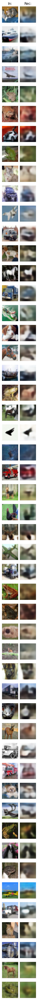

In [ ]:
def visualize_reconstructions(model, test_loader, n=20):
    model.eval()
    batch = next(iter(test_loader))
    x, _ = batch
    x = x[:n].to(model.device)

    with torch.no_grad():
        recon, _, _ = model(x)

    mean = torch.tensor([0.5, 0.5, 0.5], device=model.device).view(1,3,1,1)
    std = torch.tensor([0.5, 0.5, 0.5], device=model.device).view(1,3,1,1)
    x = x * std + mean
    recon = recon * std + mean

    fig, axes = plt.subplots(n, 2, figsize=(2, n))
    for i in range(n):
        axes[i, 0].imshow(x[i].permute(1,2,0).cpu().clamp(0,1).numpy())
        axes[0, 0].set_title('In:')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(recon[i].permute(1,2,0).cpu().clamp(0,1).numpy())
        axes[0, 1].set_title('Rec:')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

visualize_reconstructions(model, test_loader, n=50)

In [ ]:
from torch.utils.data import Dataset, DataLoader

class RandomNoiseDataset(Dataset):
    def __init__(self, num_samples, channels, height, width):
        self.num_samples = num_samples
        self.channels = channels
        self.height = height
        self.width = width

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        x = torch.randn(self.channels, self.height, self.width) * 0.5
        return x, 0  # dummy label

batch_size = 256
noise_dataset = RandomNoiseDataset(num_samples=10000, channels=3, height=32, width=32)
noise_loader = DataLoader(noise_dataset, batch_size=batch_size, shuffle=True)

for x, _ in noise_loader:
    print(x.shape)
    break


torch.Size([256, 3, 32, 32])


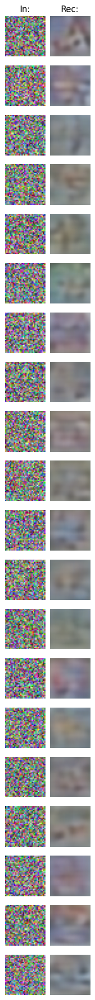

In [ ]:
visualize_reconstructions(model, noise_loader, n=20)

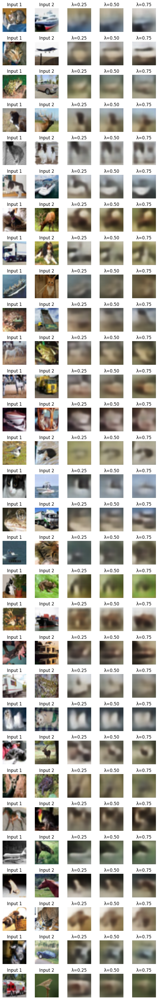

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def latent_space_interpolation(model, test_loader, lambdas, n_pairs):

    device = next(model.parameters()).device
    model = model.to(device).eval()

    mean = torch.tensor([0.5, 0.5, 0.5], device=device).view(1,3,1,1)
    std  = torch.tensor([0.5, 0.5, 0.5], device=device).view(1,3,1,1)

    n_cols = 2 + len(lambdas)
    fig, axes = plt.subplots(n_pairs, n_cols,
                             figsize=(1.3*n_cols, 1.3*n_pairs),
                             squeeze=False)

    def imshow(img, ax, title=""):
        img = img.cpu().squeeze()
        if img.ndim == 3:
            img = img.permute(1,2,0).clamp(0,1)
        ax.imshow(img, cmap='gray' if img.ndim==2 else None)
        ax.axis('off')
        ax.set_title(title)

    data_iter = iter(test_loader)
    for i in range(n_pairs):
        x_batch, _ = next(data_iter)
        x1 = x_batch[0:1].to(device)
        x2 = x_batch[1:2].to(device)

        with torch.no_grad():
            mu1, _ = model.encode(x1)
            mu2, _ = model.encode(x2)

            recon1 = model.decode(mu1)
            recon2 = model.decode(mu2)

        x1_d     = (x1     * std + mean)
        x2_d     = (x2     * std + mean)
        recon1_d = (recon1 * std + mean)
        recon2_d = (recon2 * std + mean)

        imshow(x1_d,     axes[i,0], title="Input 1")
        imshow(x2_d,     axes[i,1], title="Input 2")

        # interpolation
        for j, lam in enumerate(lambdas):
            with torch.no_grad():
                z       = (1-lam)*mu1 + lam*mu2
                recon_z = model.decode(z)
            recon_z_d = recon_z * std + mean
            imshow(recon_z_d, axes[i, 2+j], title=f"λ={lam:.2f}")

    plt.tight_layout()
    plt.show()

latent_space_interpolation(model, test_loader, lambdas=[0.25, 0.5, 0.75], n_pairs=30)

In [ ]:
# autoencoder = input_height, input_width, input_channels, encoder_layers, latent_size, decoder_layers
# encoder_layers / decoder_layers = [[out_channels1, kernel1, padding1, stride, 'encoder_layer'], ['batchnorm'],  ...]
# decoder_layer = [out_channels, kernel, padding, out_padding, stride, tanh_activation, 'decoder_layer']

model2 = AutoEncoder(32, 32, 3, [[32, 3, 1, 2, 'encoder_layer'], [32, 3, 1, 1, 'encoder_layer'], [64, 3, 1, 2, 'encoder_layer'], [64, 3, 1, 1, 'encoder_layer'], [64, 3, 1, 2, 'encoder_layer']], 512, [[64, 3, 1, 1, 2, None, 'decoder_layer'], [64, 3, 1, 0, 1, None, 'decoder_layer'], [32, 3, 1, 1, 2, None, 'decoder_layer'], [32, 3, 1, 0, 1, None, 'decoder_layer'], [3, 3, 1, 1, 2, True, 'decoder_layer']])
print(model2.get_latent_space_dimensions())
trainer = pl.Trainer(max_epochs=15, accelerator='auto', devices=1)
trainer.fit(model2, train_loader, val_loader)


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name                    | Type       | Params | Mode 
---------------------------------------------------------------
0 | encoder                 | ModuleList | 102 K  | train
1 | decoder                 | ModuleList | 102 K  | train
2 | fully_connected_section | ModuleList | 0      | train
3 | fc_mu                   | Linear     | 524 K  | train
4 | fc_var            

(4, 4, 64)


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


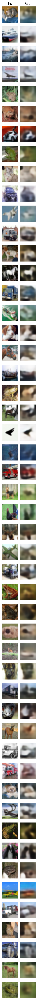

In [ ]:
visualize_reconstructions(model2, test_loader, n=50)

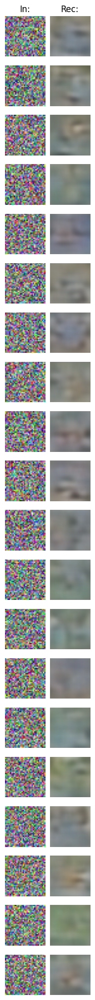

In [ ]:
visualize_reconstructions(model2, noise_loader, n=20)

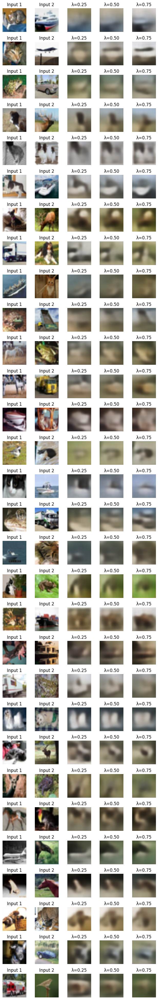

In [ ]:
latent_space_interpolation(model2, test_loader, lambdas=[0.25, 0.5, 0.75], n_pairs=30)

In [ ]:
# autoencoder = input_height, input_width, input_channels, encoder_layers, latent_size, decoder_layers
# encoder_layers / decoder_layers = [[out_channels1, kernel1, padding1, stride, 'encoder_layer'], ['batchnorm'],  ...]
# decoder_layer = [out_channels, kernel, padding, out_padding, stride, tanh_activation, 'decoder_layer']

model3 = AutoEncoder(32, 32, 3, [[32, 3, 1, 2, 'encoder_layer'], [32, 3, 1, 1, 'encoder_layer'], [64, 3, 1, 2, 'encoder_layer'], [64, 3, 1, 1, 'encoder_layer'], [64, 3, 1, 2, 'encoder_layer']], 1024, [[64, 3, 1, 1, 2, None, 'decoder_layer'], [64, 3, 1, 0, 1, None, 'decoder_layer'], [32, 3, 1, 1, 2, None, 'decoder_layer'], [32, 3, 1, 0, 1, None, 'decoder_layer'], [3, 3, 1, 1, 2, True, 'decoder_layer']])
print(model3.get_latent_space_dimensions())
trainer = pl.Trainer(max_epochs=15, accelerator='auto', devices=1)
trainer.fit(model3, train_loader, val_loader)


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name                    | Type       | Params | Mode 
---------------------------------------------------------------
0 | encoder                 | ModuleList | 102 K  | train
1 | decoder                 | ModuleList | 102 K  | train
2 | fully_connected_section | ModuleList | 0      | train
3 | fc_mu                   | Linear     | 1.0 M  | train
4 | fc_var            

(4, 4, 64)


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


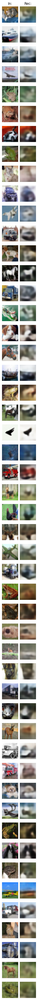

In [ ]:
visualize_reconstructions(model3, test_loader, n=50)

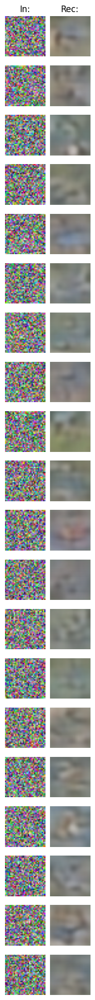

In [ ]:
visualize_reconstructions(model3, noise_loader, n=20)

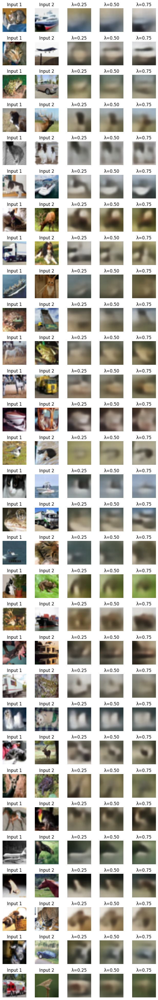

In [ ]:
latent_space_interpolation(model3, test_loader, lambdas=[0.25, 0.5, 0.75], n_pairs=30)